<font size=6>**Bayesian Optimization**</font>
<div style="border: 1px solid lightgray; padding: 10px; background-color: #f9f9f9;">

<font size=1>

    Summer School for AstroStatistics in Crete, 2025

The content presented in this notebook is the original work of the authors, unless specified otherwise.
Any publicly available material incorporated is properly credited to its respective sources.
All references to published papers, datasets, and software tools are duly acknowledged.
The original content of this notebook is licensed under the GNU General Public License v3.0 (GNU GPLv3).
</font>
</div>

<hr style="height:0.5px; border:none; color:lightgray; background-color:lightgray;">

This notebook presents **Bayesian Optimization (BO)**, a method used to find the global _optimum_ (_max_/_min_) of an <u>expensive</u> **black-box** function $f(.)$.

BO has the following <u>interesting properties</u>:

1. **Efficient** $-$ Finds the optimum in few evaluations (_e.g., compared to Grid Search_).
2. **Black-Box Optimization** $-$ No need for mathematical formulation of $f(.)$ or it gradients (_e.g., Gradient Descent_).
3. **Balances Exploration and Exploitation** $-$ Uses a probabilistic approach to sample the most informative points.
4. **Handles Noisy Data** $-$ Works well even if function evaluations are noisy.

**<u>Applications:</u>**

> - Anytime we don't have a function formula for $f(.)$
> - Anytime function evaluations are expensive (_computationally, timely, or economically_)<br>
>   &emsp; _e.g., **Hyperparameter tuning** of ML models_

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Set up a fancy plot style (you can comment it out without consequences)
import sys; sys.path.append('../src'); import plot_style

# Bayesian Optimization in action

Let's assume we have a **unknown function** which we need to minimize.

> <i>IMPORTANT: We do <u>not</u> know the functional form of f !</i>

We only know that, for every point $x_i$, we can generate a corresponding $y_i \equiv f(x_i)$

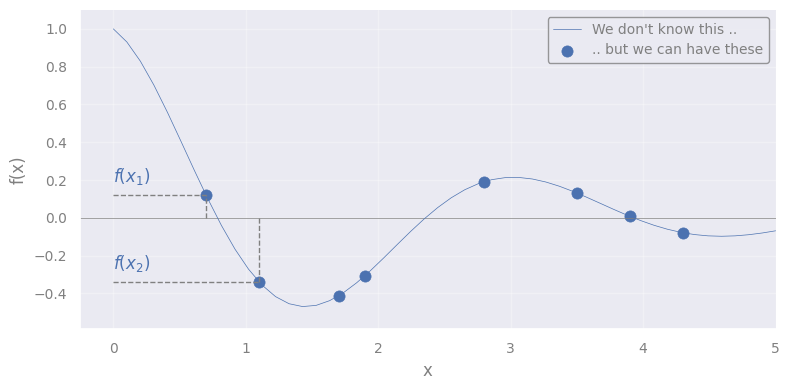

In [2]:
# Unknown function of extra-terrestrial origin:
def f(x):
    return np.exp(-0.5 * x) * np.cos(2 * x)
'''NOTE: You have to pretend we do _not_ know the mathematical form.
         Just use this `f(x)` as a black-box function.'''

X = np.array([0.7, 1.1, 1.7, 1.9, 2.8, 3.5, 3.9, 4.3])

def plot_f(X, f, show_unknown_f=False, show_segments=False):
    xx = np.linspace(0, 5, 50)
    
    plt.figure()
    plt.axhline(y=0, lw=0.5, c='grey')
    if show_unknown_f:
        plt.plot(xx, f(xx), c='C0', lw=0.5, label="We don't know this ..")
        plt.scatter(X, f(X), c='C0', s=65, lw=0.5, label=".. but we can have these")
    else:
        plt.scatter(X, f(X), c='C0', s=65, lw=0.5, label="Evaluations")
    plt.xlim([None, np.max(xx)])
    plt.ylim([-0.59, 1.1])
    plt.xlabel('x')
    plt.ylabel('f(x)')

    if show_segments:
        for i in range(2):
            plt.plot([X[i], X[i]], [0, f(X[i])], ls='--', c='grey', lw=1)  # Vertical segment to curve
            plt.plot([0, X[i]], [f(X[i]), f(X[i])], ls='--', c='grey', lw=1)  # Horizontal segment to y-axis
            plt.text(0, f(X[i])+0.1, str("$f(x_%s)$" % (i+1)), c='C0', fontsize=12, verticalalignment='center')
    
    plt.legend()
    plt.show()

plot_f(X, f, show_unknown_f=True, show_segments=True)    

## How does BO work?

As usual, we need to start from some **guess**.<br>
&emsp; (_e.g., for Gradient Descent we assume some random starting point_)

In BO, we need to start with <u>$n$ random evaluations</u> of $f(x)$ at $n$ random points: $ \{ x_1, \dots, x_n \} $.

$\rightarrow$ We are presented with this situation:

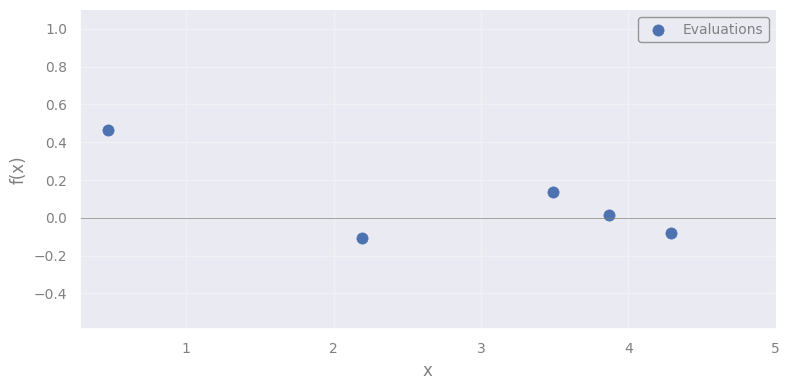

In [3]:
rng = np.random.default_rng(seed=42)

X_0 = rng.uniform(0, 5, size=5)
'''Array of initial evaluations.'''

plot_f(X_0, f)

**Task:** We need to _keep searching_ for the minimizer, $x_{min}$.

$\rightarrow$ Ok, so we search the **next guess** for $x_{min}$.

**Q:** Where would you search next, by eye?<br>
&emsp; _PS: Forget that  you saw where the min was._

<div class="alert alert-danger alertdanger"  style="border-radius: 8px; padding: 10px;">
<details>
    
<b><summary>[Spoiler] (click here to expand)</summary></b>  

- Maybe around **$x = 1.3$** $-$ where we have _no evaluations_? 
- Maybe around **$x = 2.1$** $-$ where we have _the current minimum_? 
</details>
</div>

Either way, it would be useful to have a **surrogate** (_i.e., proxy_) function, so we don't have to do it by eye.

But, we <u>don't want</u> to assume a formula for $f(x)$.

**Q:** Mh ... A model that can fit _any_ function without assuming a mathematical formula ...<br>
&emsp; Where did we possibly _saw something like this_?<br>

<div class="alert alert-danger alertdanger"  style="border-radius: 8px; padding: 10px;">
<details>
    
<b><summary>[Spoiler] (click here to expand)</summary></b>  

<table style="margin-left: 0;"><tr>
    <td width=300>
        <img src=attachment:7234562e-c661-4f5c-ba9e-49148e6e9f71.gif>
    </td>
</tr></table>

**Gaussian Processes!** 
</details>
</div>
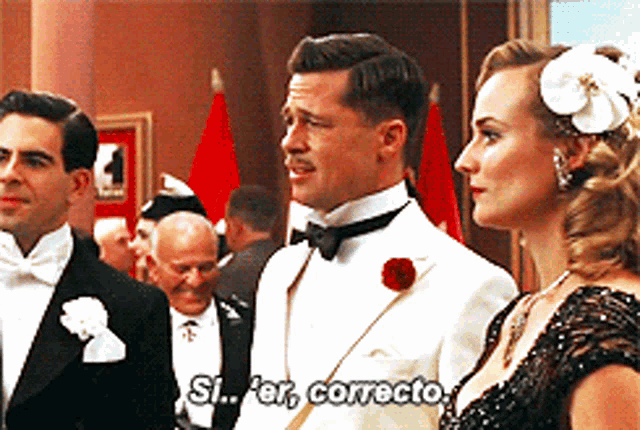

In [4]:
# Data
X_0 = X_0.reshape(-1, 1)
'''same `X` as above, but reshaped to 2D for sklearn'''
# Evaluating f at the `X_0` points
y_0 = f(X_0)

## Surrogate Function

In [5]:
def plot_GP_result(X, y, gpr):

    # Predict for the whole x-axis
    X_test = np.linspace(0, 5, 100).reshape(-1, 1)
    yhat_test, yhat_test_std = gpr.predict(X_test, return_std=True) 
    
    plt.figure()
    plt.axhline(y=0, lw=0.5, c='grey')
    plt.scatter(X.flatten(),  y, c='C0', s=30, lw=0.5, label="Evaluations")
    plt.plot(X_test.flatten(), yhat_test, c='C3', lw=1, label="Mean GP function")
    plt.fill_between(
        X_test.ravel(),
        yhat_test - yhat_test_std,
        yhat_test + yhat_test_std,
        alpha=0.2,
        color='tomato',
        label=r'1-$\sigma$ confidence interval'
    )
    plt.xlabel('x')
    plt.ylabel('f(x)')
    
    plt.legend(loc='upper center')
    plt.show()

Optimized Kernel: RBF(length_scale=10.9) + WhiteKernel(noise_level=0.0334)


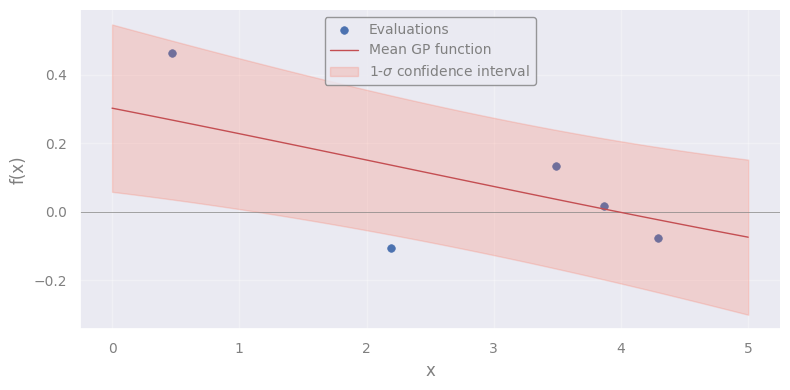

In [6]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel

# Define a kernel:
#    - RBF is the radial basis function kernel
#    - WhiteKernel handles noise in the data
kernel = RBF(length_scale=1.0) + WhiteKernel(noise_level=0.3)

# Initialize the Gaussian Process Regressor
gpr = GaussianProcessRegressor(kernel=kernel, random_state=42)

# Fit the model
gpr.fit(X_0, y_0)

# Print the optimized kernel parameters after fitting
print("Optimized Kernel:", gpr.kernel_)

plot_GP_result(X_0, y_0, gpr)

_Mh ... this is not really useful to predict the next guess._

**Why?** $\rightarrow$ Because we assumed error in the points $y_i$ (_standard GP_).

> For BO, we would like to assume that $y_i$ is <u>exactly equal</u> to $f(x_i)$, for the evaluated points.

Instead of RBF + White Noise $\rightarrow$ We use the **Matern** kernel [[documentation]](https://scikit-learn.org/stable/modules/generated/sklearn.gaussian_process.kernels.Matern.html)

Optimized Kernel: Matern(length_scale=2.18, nu=2.5)


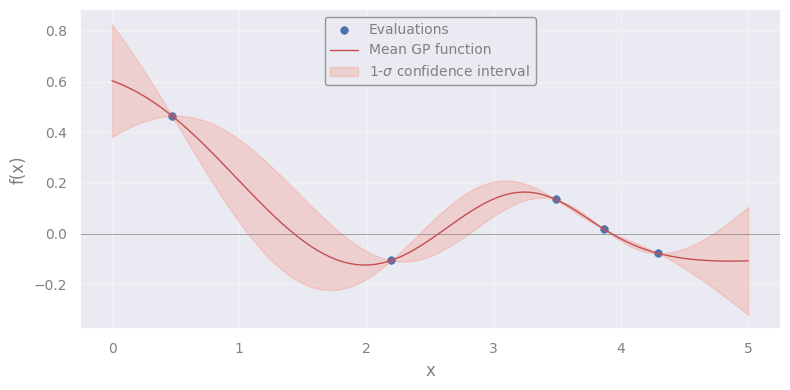

In [7]:
from sklearn.gaussian_process.kernels import Matern

# Define a kernel:
kernel = Matern(length_scale=1.0, nu=2.5)

# Initialize the Gaussian Process Regressor
gpr = GaussianProcessRegressor(kernel=kernel, random_state=42)

# Fit the model
gpr.fit(X_0, y_0)

# Print the optimized kernel parameters after fitting
print("Optimized Kernel:", gpr.kernel_)

plot_GP_result(X_0, y_0, gpr)

Notice how the uncertainties at the points $x_i$ is 0.

Ok, so we have the **surrogate function**. &emsp; _But ..._ where do we pick the next guess for the _min_?

We sort of have the same issue as before:
- Maybe around **$x = 1.3$** or **$5$** $-$ where we have _large uncertainty_? 
- Maybe around **$x = 1.9$** $-$ where we have _the surrogate minimum_? 

**Q:**  How can we decide? (_in-class discussion_)

<div class="alert alert-danger alertdanger" style="border-radius: 8px; padding: 10px;">
<details>

<b><summary>[Spoiler] (click here to expand)</summary></b>  

We need to balance 
- **Exploration** $-$ _testing unknown regions_
- **Exploitation** $-$ _refining known promising areas_

$\rightarrow$ For this balance, we create a second function: the **Acquisition Function**

</details>
</div>

## Acquisition Function

The **Acquisition Function** uses the surrogate function to suggest where to pick the next guess.

There are many options, e.g.:

> - **Upper Confidence Bound (UCB)** $-$ _Prioritizes points with high potential._
>- **Probability of Improvement (PI)** $-$ _Selects the point with the highest probability of being better than the best-observed outcome._

... But here we will see the

> - **Expected Improvement (EI)** $-$ _Picks points that are expected to improve upon the best result so far._


<div class="alert alert-info" role="alert" style="border-radius: 8px; padding: 10px;">
<details>
    
<b><summary>[Detailed derivation] (click here to expand)</summary></b>
   
We can define an **Improvement** function **$I(x)$** $\rightarrow$ how much better a point $x$ is compared to the current best $\bar{f}$:

$$ I(x) = \max(f(x) - \bar{f}, 0) $$

( _if $f(x) > \bar{f}$, the improvement is $(f(x) - \bar{f})$; otherwise, 0_ ).

the **Expected Improvement (EI)** is computed as its expectation:

$$ EI(x) = \mathbb{E}[\max(f(x) - \bar{f}, 0)] $$

$$ EI(x) = \int_{\bar{f}}^{\infty} (f - \bar{f}) p(f \mid x) df \tag{1}$$

What $p(f \mid x)$ shall we use? $\rightarrow$ Since we assume that $f(x)$ is a GP:

$$ f(x) \sim \mathcal{N}(\mu(x), \sigma^2(x)) $$

( _where $\sigma^2(x)$ is calculated using the kernel function $k(x, x')$_ )

we literally have:

$$ p(f \mid x) = \frac{1}{\sqrt{2\pi} \sigma(x)} \exp\left( -\frac{(f - \mu(x))^2}{2\sigma^2(x)} \right) $$


Thanks to the properties of Gaussian distributions $-$ Eq. 1 has an <u>analytical solution</u>:

$$ EI(x) = (\mu(x) - \bar{f}) \Phi(Z) + \sigma(x) \phi(Z) $$

where:

- $ Z = \frac{\mu(x) - \bar{f}}{\sigma(x)} $
- $ \Phi(Z) $ : **CDF** of the standard normal
- $ \phi(Z) $ : **PDF** of the standard normal

</details>
</div>

**<u>TL;DR</u>**

In summary, the EI is composed of **2 terms**:

$$ EI(x) = (\mu(x) - \bar{f}) \Phi(Z) + \sigma(x) \phi(Z) $$

- The term $ (\mu(x) - \bar{f}) \Phi(Z)$ $\leftrightarrow$ **Exploitation** &emsp; (_mean improvement_)
- The term $ \sigma(x) \phi(Z)$ &emsp;&emsp;&emsp; $\leftrightarrow$ **Exploration** &emsp; (_uncertainty from the GP kernel_)

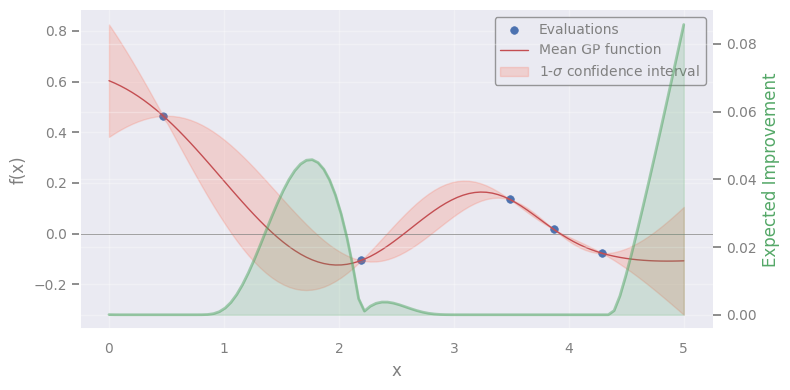

	EI max at: 5.00


In [8]:
from scipy.stats import norm
from sklearn.gaussian_process.kernels import Matern

def compute_EI(X, y, X_test, return_X_prime=False):

    # Define a kernel:
    kernel = Matern(length_scale=1.0, nu=2.5)
    
    # Initialize the Gaussian Process Regressor
    gpr = GaussianProcessRegressor(kernel=kernel, random_state=42)
    
    # Fit the model
    gpr.fit(X, y)

    # Predict for the whole x-axis
    yhat_test, yhat_test_std = gpr.predict(X_test, return_std=True) 

    # Best observed value
    f_bar = np.min(y)
    
    # Compute Expected Improvement (EI)
    Z = (f_bar - yhat_test) / yhat_test_std
    EI = (f_bar - yhat_test) * norm.cdf(Z) + yhat_test_std * norm.pdf(Z)
    EI[yhat_test_std == 0] = 0  # Avoid division by zero

    # Figure
    fig, ax = plt.subplots()
    
    ax.axhline(y=0, lw=0.5, c='grey')
    ax.scatter(X.flatten(),  y, c='C0', s=30, lw=0.5, label="Evaluations")
    ax.plot(X_test.flatten(), yhat_test, c='C3', lw=1, label="Mean GP function")
    ax.fill_between(
        X_test.ravel(),
        yhat_test - yhat_test_std,
        yhat_test + yhat_test_std,
        alpha=0.2,
        color='tomato',
        label=r'1-$\sigma$ confidence interval'
    )
    
    # Twin axis for EI
    ax_twin = ax.twinx()
    ax_twin.plot(X_test, EI, 'C2', label="EI", alpha=0.5)
    ax_twin.fill_between(X_test.ravel(), EI, color='C2', alpha=0.2)
    
    ax.set_xlabel('x')
    ax.set_ylabel('f(x)')
    ax_twin.set_ylabel("Expected Improvement", color='C2')
    
    ax.legend(loc='best')
    plt.show()

    X_prime = X_test.flatten()[np.argmax(EI)]
    print('\tEI max at: %.2f' % X_prime)
    
    if return_X_prime:
        return X_prime

# Search interval (called `X_test` because we will `predict` the GP there)
X_test = np.linspace(0, 5, 100).reshape(-1, 1)

compute_EI(X_0, y_0, X_test)

The EI function _suggests_ $x' = 5$ as the new _minimum_.

How do we proceed?

> 1. We **evaluate** $f(.)$ at $x'$

In [9]:
X_prime = 5
y_prime = f(X_prime)

> 2. We **add** it to our bucket of observations

In [10]:
X_1 = np.array(list(X_0.flatten()) + [X_prime]).reshape(-1, 1)
y_1 = np.array(list(y_0.flatten()) + [y_prime])

> 3. **Re-run** the whole process

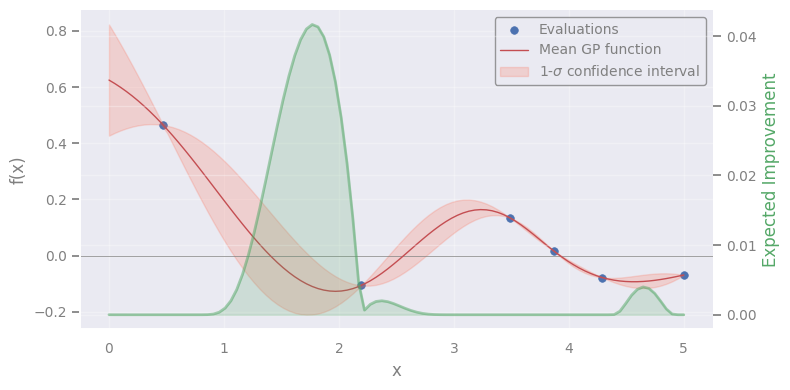

	EI max at: 1.77


In [11]:
compute_EI(X_1, y_1, X_test)

> 4. And **repeat** until some convergence criterion<br>
>    (_e.g., max iterations, no improvement, football match is starting_)


Iteration 1


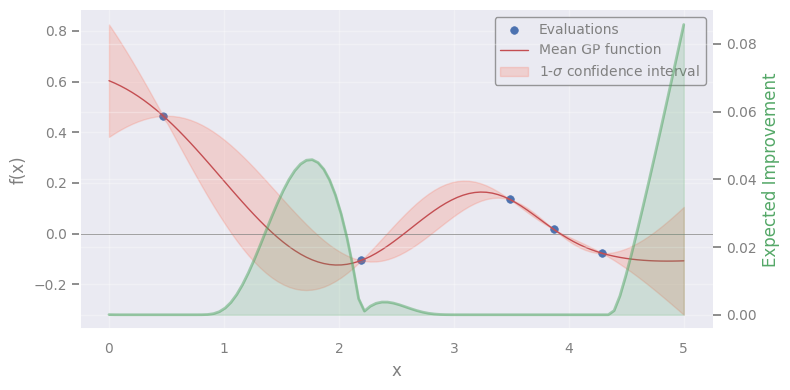

	EI max at: 5.00

Iteration 2


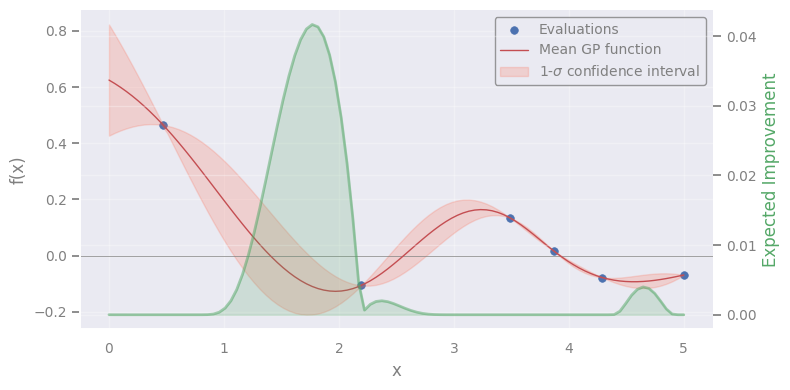

	EI max at: 1.77

Iteration 3


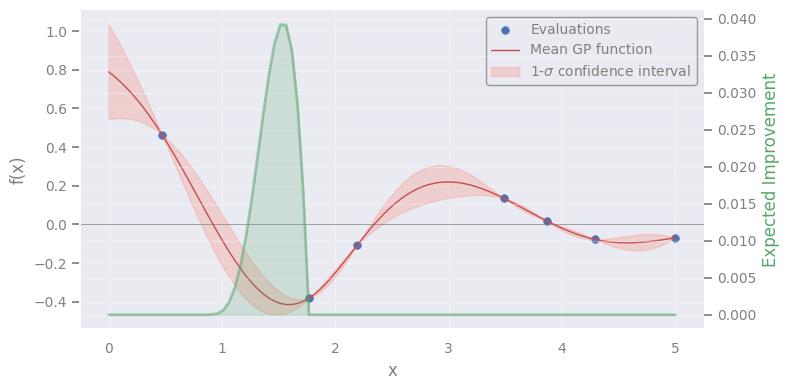

	EI max at: 1.52

Iteration 4


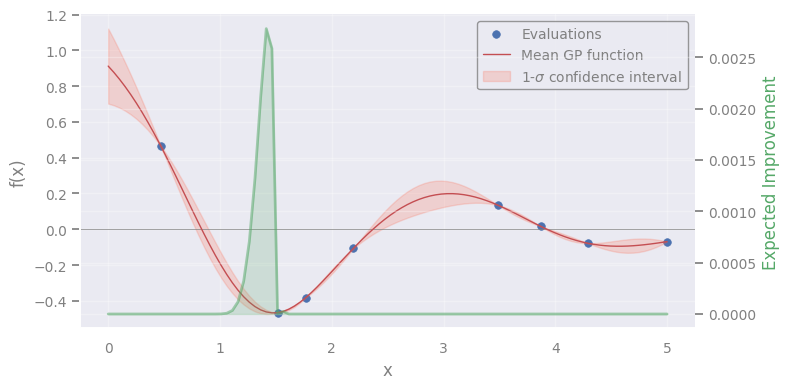

	EI max at: 1.41

Iteration 5


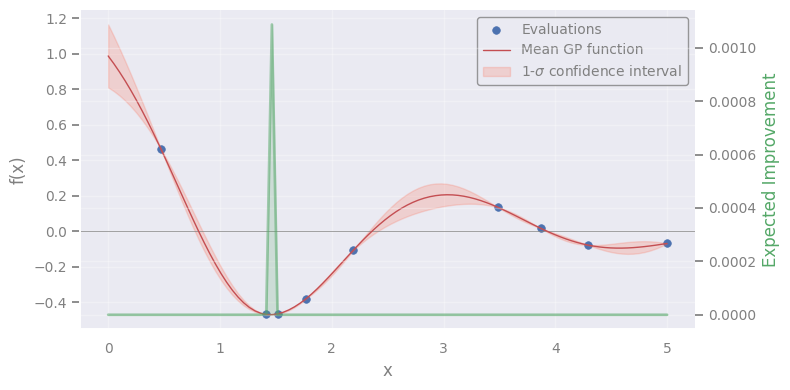

	EI max at: 1.46

Iteration 6


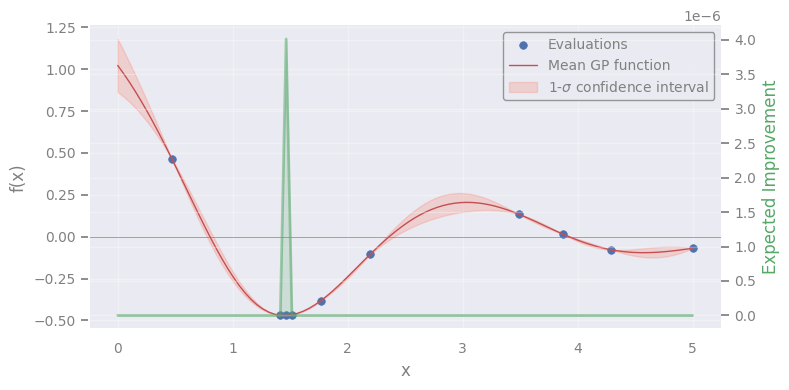

	EI max at: 1.46

Iteration 7


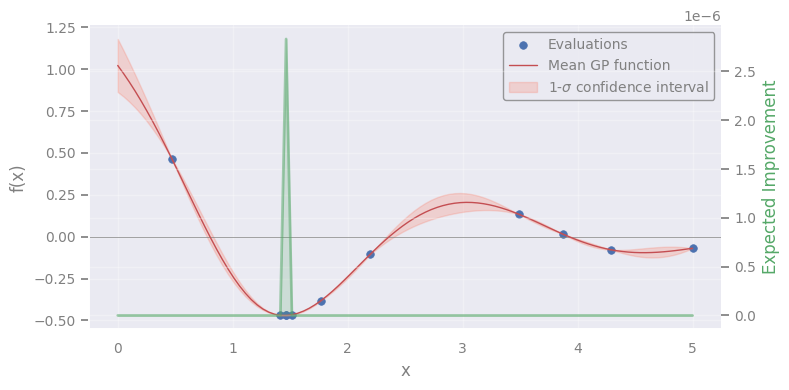

	EI max at: 1.46

Iteration 8


/media/work/software/miniconda3/envs/astrostat25/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:660: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL: .

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


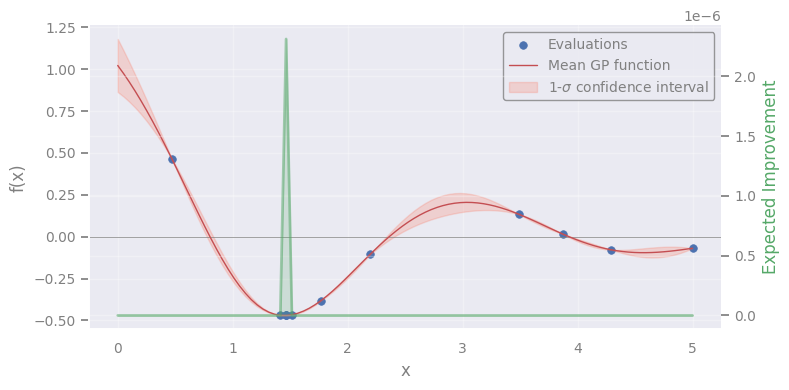

	EI max at: 1.46

Iteration 9


/media/work/software/miniconda3/envs/astrostat25/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:660: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL: .

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


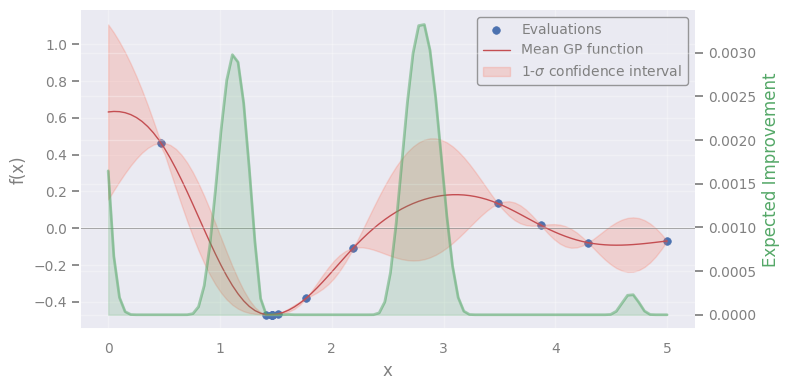

	EI max at: 2.83

Iteration 10


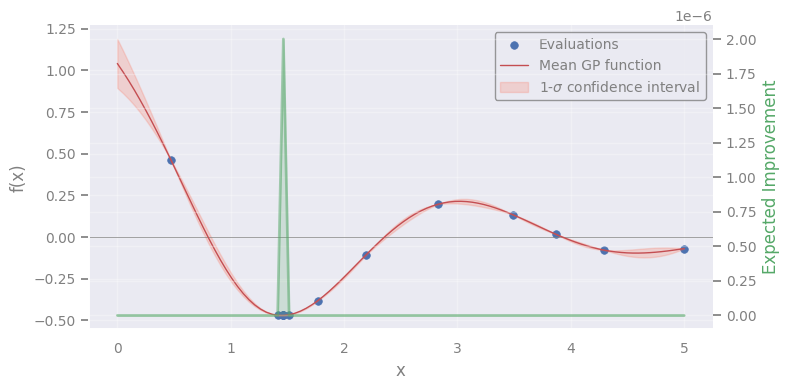

	EI max at: 1.46


In [12]:
X_next = X_0.copy()
y_next = y_0.copy()

for i in range(10):
    print('\nIteration %s' % (i+1))
    X_prime = compute_EI(X_next, y_next, X_test, return_X_prime=True)

    y_prime = f(X_prime)

    X_next = np.array(list(X_next.flatten()) + [X_prime]).reshape(-1, 1)
    y_next = np.array(list(y_next.flatten()) + [y_prime])

# Do I have to do it by hand?

No! $\rightarrow$ There are plenty `Python` libraries for Bayesian Optimization, _e.g._:
- `Hyperopt` [[docs]](http://hyperopt.github.io/hyperopt/)
- `Optuna` [[docs]](https://optuna.org/)
- `GPyOpt` [[docs]](https://sheffieldml.github.io/GPyOpt/)
- `Mango` [[docs]](https://github.com/ARM-software/mango)

... each with different **PROS** and **CONS**:

<table style="width:80%">
    <colgroup>
        <col style="width:20%">
        <col style="width:40%">
        <col style="width:40%">
    </colgroup>
    <tr>
        <td style="text-align:center"><b>Library</b></td>
        <th>PROS</th>
        <th>CONS</th>
    </tr>
    <tr>
        <td style="text-align:center">HyperOpt</td>
        <td>
            • Most known, lots of documentation<br>
        </td>
        <td>
            • No categorical variables support<br>
        </td>
    </tr>
    <tr>
        <td style="text-align:center">Optuna</td>
        <td>
            • Fast<br>
            • Great visualization tools<br>
            • Supported<br>
        </td>
        <td>
            • Constraints are "soft" (<i>not necessarily respected</i>)<br>
        </td>
    </tr>
    <tr>
        <td style="text-align:center">GPyOpt</td>
        <td>
            • True hard constraints<br>
        </td>
        <td>
            • No relative constraints<br>
            • Categorical variables must be label-encoded<br>
            • Support terminated<br>
        </td>
    </tr>
    <tr>
        <td style="text-align:center">Mango</td>
        <td>
            • True hard constraints<br>
            • Relative constraints<br>
            • Easy syntax<br>
        </td>
        <td>
            • Slow (<i>at least on single worker mode</i>)<br>
            • Categorical variables must be label-encoded<br>
            • No multi-objective optimization<br>
            • Rare updates<br>
        </td>
    </tr>
</table>

$\rightarrow$ We will use ...


# Optuna

```python
pip install optuna plotly nbformat
```
<hr style="height:0.5px; border:none; color:lightgray; background-color:lightgray;">

In Bayesian Optimization, we must frame the problem in terms of **Objective Function** $\leftrightarrow$ The function to _optimize_

In **Optuna** we may to specify it as a simple `function` that wraps:
- the function to be optimized, $f(.)$
- the search space

In [13]:
import optuna
import numpy as np

# Unknown function of extra-terrestrial origin:
def f(x):
    return np.exp(-0.5 * x) * np.cos(2 * x)

def objective(trial):
    '''Here, `trial` is an object internally created by the library.
    A trial carries all the information about one iteration of the
    optimization.'''
    
    x = trial.suggest_float("x", 0, 5)
    '''   
    The `.suggest_float` method signifies that, at each trial, the
    library will propose a new guess `x` for the minimum.
    That number is a ... float, since our function takes a float as
    its single input.
    
    We are limiting the search space for the new proposal between 0 and 5.
    (we called this range `X_test` above, when we did it by hand)    
    '''
    
    return f(x)
    '''This is literally the `f(x)` defined at the top of this cell.
    Therefore, we return the value of the function at the proposed min.'''

study = optuna.create_study(direction="minimize")
'''
Here, we instantiate an object called `study`, which will collect all
the results of the search, including the intermediate ones.

Notice that we want to find the min the function, hence we specify:
    "minimize"
'''

# Launch search
study.optimize(objective, n_trials=100, show_progress_bar=True)
'''Try a loop of `n_trials` guesses'''

print("\nMin function value encountered in the search: %.2g" % study.best_value)
print(" '--> Found at X_min: %.2f" % study.best_params["x"])

[I 2025-06-10 21:42:38,863] A new study created in memory with name: no-name-99780881-02d9-4049-bf66-4f6b71e51732


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2025-06-10 21:42:38,868] Trial 0 finished with value: 0.13021489855719917 and parameters: {'x': 2.606097964628013}. Best is trial 0 with value: 0.13021489855719917.
[I 2025-06-10 21:42:38,869] Trial 1 finished with value: -0.30333675159719314 and parameters: {'x': 1.9040838148818824}. Best is trial 1 with value: -0.30333675159719314.
[I 2025-06-10 21:42:38,870] Trial 2 finished with value: -0.2763832285260642 and parameters: {'x': 1.025218908117909}. Best is trial 1 with value: -0.30333675159719314.
[I 2025-06-10 21:42:38,871] Trial 3 finished with value: -0.29222668711308974 and parameters: {'x': 1.04270501435948}. Best is trial 1 with value: -0.30333675159719314.
[I 2025-06-10 21:42:38,872] Trial 4 finished with value: -0.0983679404611309 and parameters: {'x': 0.8613493713918263}. Best is trial 1 with value: -0.30333675159719314.
[I 2025-06-10 21:42:38,873] Trial 5 finished with value: -0.09557733528015729 and parameters: {'x': 4.694335073810167}. Best is trial 1 with value: -0.30

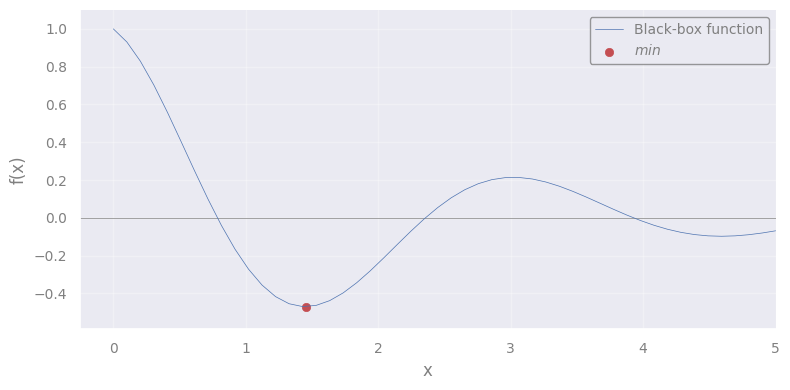

In [14]:
# Plot location of the min 
X_min = study.best_params["x"]
f_min = f(X_min)

xx = np.linspace(0, 5, 50)

plt.figure()
plt.axhline(y=0, lw=0.5, c='grey')
plt.plot(xx, f(xx), c='C0', lw=0.5, label="Black-box function")
plt.scatter(X_min, f_min, c='C3', lw=0.5, label=r"$min$")
plt.xlim([None, np.max(xx)])
plt.ylim([-0.59, 1.1])
plt.xlabel('x')
plt.ylabel('f(x)')

plt.legend()
plt.show()

## Exploring the results

We can see the history of the function **evaluations** across the trials:

In [15]:
from plotly.io import show
fig = optuna.visualization.plot_optimization_history(study)
show(fig)

This plots shows $f_{min} = f(x_{min})$ as a function of time (_trial_).

> The red curve is the **best** $min$ found so far.

**Q:** Why sometimes it goes up?<br>

<div class="alert alert-danger alertdanger" style="border-radius: 8px; padding: 10px;">
<details>
    
<b><summary>[Spoiler] (click here to expand)</summary></b>  

Because BO has a component of **exploration**! $\rightarrow$ Sometimes is tries values far from the current min.
</details>
</div>

In general, though, the curve is descending, possibly to the <u>global</u> $min$.

# BO for parametric fitting

Let's see how we can use Bayesian Optimization for **parametric fitting**.

This is the classic case we saw over and over in ML $-$ i.e., given a model $\mathcal{M}$:

$$\mathcal{M}(X~|~\boldsymbol{\theta})$$

we want to find the <u>optimal</u> set of parameters $\hat{\boldsymbol{\theta}}$.

## Example $-$ Modelling the light distribution of a galaxy

Let's create a mock **disky galaxy** image:

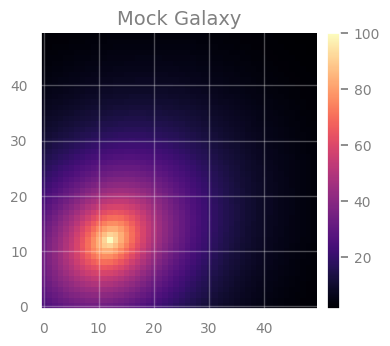

In [16]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Step 1: Create mock galaxy image
def create_mock_galaxy(image_size, x_center, y_center, Rh, I0, ellipticity, PA):
    """
    Creates a mock galaxy image with an exponential profile, ellipticity, and position angle.

    Parameters:
    - image_size: Size of the image along its side (pixels)
    - x_center: galaxy center along x
    - y_center: galaxy center along y
    - Rh: Scale radius
    - intensity: Central intensity
    - ellipticity: Flattening (0 = circular, 1 = line)
    - PA: Angle in degrees, measured counterclockwise from the x-axis
    """
    y, x = np.indices((image_size, image_size))

    # Convert position angle to radians
    alpha = np.radians(PA)

    # Rotation transformation for the coordinates
    dx = x - x_center
    dy = y - y_center
    x_rot = dx * np.cos(alpha) + dy * np.sin(alpha)
    y_rot = -dx * np.sin(alpha) + dy * np.cos(alpha)

    # Apply ellipticity
    x_rot_scaled = x_rot * (1 - ellipticity)

    # Calculate the radius with ellipticity and rotation
    radius = np.sqrt(x_rot_scaled**2 + y_rot**2)

    # Exponential profile
    image = I0 * np.exp(-radius / Rh)
    return image

image_size = 50

# Parameters for the mock galaxy
true_x_center = 12
true_y_center = 12
true_Rh = 10
true_I0 = 100
true_ellipticity = 0.2
true_PA = 45  # in degrees

# Generate the mock galaxy image
mock_image = create_mock_galaxy(
    image_size, true_x_center, true_y_center, true_Rh, true_I0, true_ellipticity, true_PA
)

# Optionally save the mock image to a FITS file
# fits.writeto('mock_galaxy.fits', mock_image, overwrite=True)

# Visualize the mock galaxy image
fig, ax = plt.subplots(figsize=(4, 4))
im = ax.imshow(mock_image, origin='lower', cmap='magma')
ax.set_title("Mock Galaxy")

# Create a divider to add the colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(im, cax=cax)

plt.show()

Suppose this is the image of a disky galaxy seen at some _inclination_. 

<hr style="height:0.5px; border:none; color:lightgray; background-color:lightgray;">

Now, for the model, we will assume an **exponential** disk:

$$
\begin{aligned}
\mathcal{M}(X \mid \boldsymbol{\theta}) &=  \\
\mathcal{M}(x, y \mid I_0, R_h) &= I_0 \exp\left(-\frac{r}{R_h}\right)
\end{aligned}
$$

where the data matrix $X$ is composed by the _pixel_ **positions** $(x, y)$, and the model $\mathcal{M}$ predicts the _pixel_ **value** at $(x, y)$.

Here, $r$ is the **distance** of a pixel $(x, y)$ from the galaxy center $(x_{center}, y_{center})$.

In summary $-$ The parameter array $\boldsymbol{\theta}$ is composed by:

- $I_0$: **central intensity** (_i.e., central value_)
- $R_h$: **scale radius** (_i.e., a normalization factor for the radius_)
- $x_{center}$: galaxy's center along the $x$-axis
- $y_{center}$: galaxy's center along the $y$-axis

However, notice that that galaxy's image is at some **position angle** (**PA**; _i.e., rotation w.r.t. the vertical_) and has **ellipticity** $\varepsilon$.

Therefore, the _actual_ model parameters array is:

$$\boldsymbol{\theta} = \{ I_0, R_h, x_{\text{center}}, y_{\text{center}}, PA, \varepsilon \}$$ 

<div class="alert alert-block alert-info"; style="border-radius: 8px; padding: 10px;">
<details>
    
<b><summary>[Detailed derivation] (click here to expand)</summary></b>

$\rightarrow$ We need to calculate the **rotated** and **elliptically squeezed** coordinates $-$ Here's how.

The position angle is converted to radians:

$$\alpha = \text{radians}(\text{PA})$$

The coordinate system is centered at $(x_{center}, y_{center})$, and a rotation transformation is applied:

$$dx = x - x_{center}, \quad dy = y - y_{center}$$

$$x_{rot} = dx \cos\alpha + dy \sin\alpha$$

$$y_{rot} = -dx \sin\alpha + dy \cos\alpha$$

To introduce ellipticity $\varepsilon$, we scale the rotated $x$-coordinate:

$$x_{rot, scaled} = x_{rot} (1 - \varepsilon)$$

The elliptical radius is then computed as:

$$r = \sqrt{x_{rot, scaled}^2 + y_{rot}^2}$$

Finally, given that the intensity profile follows an exponential distribution:

$$I(x, y) = I_0 \exp\left(-\frac{r}{R_h}\right)$$

... the complete model can be expressed as:

$$
\mathcal{M}(X \mid \boldsymbol{\theta}) = I_0 \exp\left(-\frac{1}{R_h} \sqrt{ \left( (x - x_{center}) \cos\alpha + (y - y_{center}) \sin\alpha \right)^2 (1 - \varepsilon)^2 + \left( -(x - x_{center}) \sin\alpha + (y - y_{center}) \cos\alpha \right)^2 } \right)
$$

... from which it is clear that:

$$\boldsymbol{\theta} = \{ I_0, R_h, x_{\text{center}}, y_{\text{center}}, PA(\alpha), \varepsilon \}$$ 

</details>
</div>

Let's code this model:

In [17]:
def model(x_center, y_center, Rh, I0, ellipticity, PA, image_size=50):
    """
    Generates a model galaxy image using the provided parameters and the image size.

    Parameters
    ----------
    - x_center : float
        Galaxy pixel center along x
    - y_center : float
        Galaxy pixel center along y
    - Rh : float
        Scale radius
    - I0 : float
        Central intensity
    - ellipticity: float
        Flattening (0 = circular, 1 = line)
    - PA : float
        Angle in degrees, measured counterclockwise from the x-axis
    - image_size : optional (default: 50)
        Size of the image along its side (pixels)
        NOTE: This is _not_ a parameter of the model

    Return
    ------
    - model_image : np.ndarray
        Model image.
    """
    
    y, x = np.indices((image_size, image_size))

    # Convert position angle to radians
    alpha = np.radians(PA)

    # Rotation transformation for the coordinates
    dx = x - x_center
    dy = y - y_center
    x_rot = dx * np.cos(alpha)  + dy * np.sin(alpha)
    y_rot = -dx * np.sin(alpha) + dy * np.cos(alpha)

    # Apply ellipticity
    x_rot_scaled = x_rot * (1 - ellipticity)

    # Calculate the radius with ellipticity and rotation
    radius = np.sqrt(x_rot_scaled**2 + y_rot**2)

    # Exponential profile
    model_image = I0 * np.exp(-radius / Rh)
    
    return model_image

## Framing the optimization problem

> To obtain $\hat{\boldsymbol{\theta}}$ $\rightarrow$ we need a function to _minimize_.

**Remember:** We need to fit the model to the data.

**Q:** So, shall we minimize $\mathcal{M}(X \mid \boldsymbol{\theta})$ ? $~~~$ (_in-class discussion_)

<div class="alert alert-danger alertdanger"; style="border-radius: 8px; padding: 10px;">
<details>
    
<b><summary>[Spoiler] (click here to expand)</summary></b>  

**A:** No, that doesn't even make sense!

We need to minimize an **error function** to compare the difference between the **image** and the **model image**.<br>
We can use the good ol' **sum of squared errors**:

$$ S = \sum_i err_i^2 = \sum_i (\text{true}_i - \text{pred}_i)^2 $$

which, for images, means the _pixel-by-pixel_ comparison:

$$ S = \sum_i (\text{image}(x, y)_i - \text{model\_image}(x, y)_i)^2 $$

where $(x, y)_i$ are the coordinates of pixel $i$.

</details>
</div>

In [18]:
def sum_squared_errors(image, model_image):
    S = np.sum((image - model_image) ** 2)
    return S

We are ready to setup Optuna's **Objective function**.

Consider that this function should do the job **top-to-bottom** $-$ i.e.:
1. **draw** the parameters for the current trial
2. create a **model** image with such parameters
3. calculate and return the **sum of squares**, $S$


In [19]:
def objective(trial):
    
    # 1. Draw parameters
    x_center    = trial.suggest_float("x_center", 0, 50)
    y_center    = trial.suggest_float("y_center", 0, 50)
    Rh          = trial.suggest_float("Rh", 5, 20)
    I0          = trial.suggest_float("I0", 50, 150)
    ellipticity = trial.suggest_float("ellipticity", 0, 1.0)
    PA          = trial.suggest_float("PA", 0, 180)

    # 2. Generate model image
    model_image = model(x_center, y_center, Rh, I0, ellipticity, PA)

    # 3. Compute and return sum of squared errors
    S = np.sum((mock_image - model_image) ** 2)
    return S

## Optimization

Finally, we can **run the optimization**:

In [20]:
import optuna

study = optuna.create_study(direction="minimize", sampler=optuna.samplers.TPESampler(seed=42))
study.optimize(objective, n_trials=500, show_progress_bar=True)

[I 2025-06-10 21:42:45,879] A new study created in memory with name: no-name-84fc1ef9-7d63-4a25-8078-6864e4354623


  0%|          | 0/500 [00:00<?, ?it/s]

[I 2025-06-10 21:42:45,886] Trial 0 finished with value: 2713891.256261649 and parameters: {'x_center': 18.727005942368123, 'y_center': 47.53571532049581, 'Rh': 15.979909127171076, 'I0': 109.86584841970367, 'ellipticity': 0.15601864044243652, 'PA': 28.079013660516477}. Best is trial 0 with value: 2713891.256261649.
[I 2025-06-10 21:42:45,887] Trial 1 finished with value: 2360384.0498608453 and parameters: {'x_center': 2.9041806084099733, 'y_center': 43.308807288746756, 'Rh': 14.016725176148132, 'I0': 120.80725777960456, 'ellipticity': 0.020584494295802447, 'PA': 174.58377338915898}. Best is trial 1 with value: 2360384.0498608453.
[I 2025-06-10 21:42:45,889] Trial 2 finished with value: 1706880.4001844593 and parameters: {'x_center': 41.622132040021086, 'y_center': 10.616955533913808, 'Rh': 7.727374508106509, 'I0': 68.34045098534338, 'ellipticity': 0.3042422429595377, 'PA': 94.45615769380281}. Best is trial 2 with value: 1706880.4001844593.
[I 2025-06-10 21:42:45,890] Trial 3 finished w

In [21]:
import pprint

# Retrieve best-fit parameters
best_params = study.best_params

print("Best-fit parameters:")
pprint.pprint(best_params)

Best-fit parameters:
{'I0': 89.18205197070311,
 'PA': 31.30351442396769,
 'Rh': 11.478814144286769,
 'ellipticity': 0.16686610625379625,
 'x_center': 11.898958944440396,
 'y_center': 11.259873479923582}


## Inspecting the Residuals

Let's create the $best$-fit model image, simply using the best parameter set $\hat{\boldsymbol{\theta}}$: 

In [22]:
# theta_hat
best_x_center    = best_params["x_center"]
best_y_center    = best_params["y_center"]
best_Rh          = best_params["Rh"]
best_I0          = best_params["I0"]
best_ellipticity = best_params["ellipticity"]
best_PA          = best_params["PA"]

best_model_image = model(best_x_center, best_y_center, best_Rh, best_I0, best_ellipticity, best_PA)

... and compare the true image with the model:

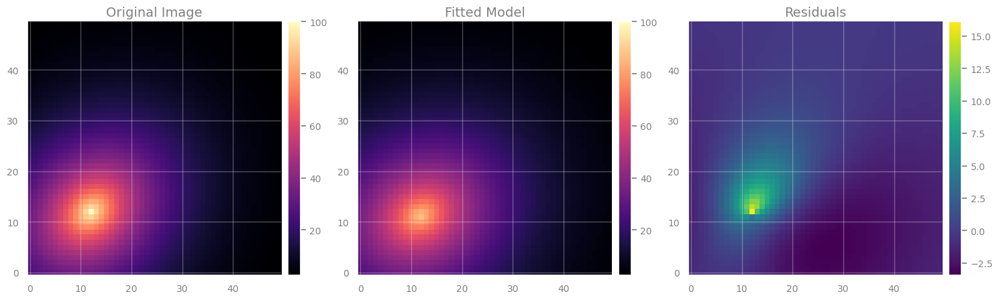

In [23]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from astropy.visualization import ZScaleInterval

def plot_comparison(image, best_model_image):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Apply ZScale interval for color scaling
    interval = ZScaleInterval()
    vmin, vmax = interval.get_limits(image)
    
    # Plot the original image
    ax1 = axes[0]
    im1 = ax1.imshow(image, cmap='magma', origin='lower', vmin=vmin, vmax=vmax)
    ax1.set_title("Original Image")
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    plt.colorbar(im1, cax=cax1)
    
    # Plot the fitted model
    ax2 = axes[1]
    im2 = ax2.imshow(best_model_image, cmap='magma', origin='lower', vmin=vmin, vmax=vmax)
    ax2.set_title("Fitted Model")
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    plt.colorbar(im2, cax=cax2)
    
    # Plot the residuals
    ax3 = axes[2]
    im3 = ax3.imshow(image - best_model_image, origin='lower', cmap='viridis')
    ax3.set_title("Residuals")
    divider3 = make_axes_locatable(ax3)
    cax3 = divider3.append_axes("right", size="5%", pad=0.1)
    plt.colorbar(im3, cax=cax3)
    
    plt.tight_layout()
    plt.show()

plot_comparison(mock_image, best_model_image)    

<u>IMPORTANT:</u> Notice that the color scale of the residuals is different! $\rightarrow$ This is a decent fit!

<div class="alert alert-block alert-warning"; style="border-radius: 8px; padding: 10px;">

#  In-class Exercise [30 min]

**Objective:** Use BO for parametric fitting of a realistic image. 

**Dataset:** An astronomical image.
</div>    

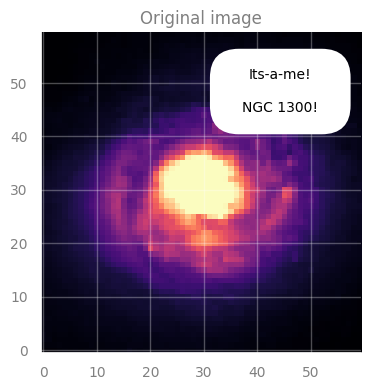

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.text import Text
from astropy.io import fits
from astropy.visualization import ZScaleInterval
import requests
from io import BytesIO
from skimage.transform import rescale

# Download NGC 1300 galaxy image from HST archive (FITS format)
fits_url = "https://hla.stsci.edu/cgi-bin/fitscut.cgi?red=hst_08597_11_wfpc2_f606w_pc&size=ALL&format=fits&config=ops"
response = requests.get(fits_url)
fits_file = BytesIO(response.content)

# Load the FITS image
data_fits = fits.getdata(fits_file)

# Crop image around galaxy
data_crop = data_fits[350:650, 425:725]

# Downscale the image (for faster computations)
scale_factor = 5
data = rescale(data_crop, 1/scale_factor, anti_aliasing=True, preserve_range=True).astype(data_crop.dtype)

# > Figure
fig, axes = plt.subplots(nrows=1, ncols=1)
axes = [axes]

# Apply ZScale interval for color scaling
interval = ZScaleInterval()
vmin, vmax = interval.get_limits(data)

axes[0].set_title("Original image", fontsize=12)
axes[0].imshow(data, cmap='magma', origin='lower', vmin=vmin, vmax=vmax)

# Create a speech bubble (balloon)
bubble_width = 0.3
bubble_height = 0.1

bubble = patches.FancyBboxPatch(
    (0.7, 0.8), bubble_width, bubble_height,
    boxstyle="round,pad=0.1", edgecolor="white", facecolor="white", lw=2,
    transform=ax.transAxes
)
axes[0].add_patch(bubble)

text = Text(
    x=0.7+bubble_width/2, y=0.85, text="Its-a-me!\n\nNGC 1300!",
    fontsize=10, color="black", transform=ax.transAxes,
    verticalalignment="center", horizontalalignment="center", wrap=True
)
axes[0].add_artist(text)

plt.tight_layout()
plt.show()

<div class="alert alert-block alert-warning"; style="border-radius: 8px; padding: 10px;">

Here are the data image and its size:

</div>

In [25]:
image_NGC1300 = data.copy()

image_size = image_NGC1300.shape[0]

<div class="alert alert-block alert-warning"; style="border-radius: 8px; padding: 10px;">

**Task:** Using the example above as a reference, use BO for fitting this galaxy.

_In particular, you must:_

1. Create a **model** function (_you may use exactly the same_)
2. Define the **Objective** function
3. **Run** the optimization
4. **Inspect** the best-fit parameters (_do they make sense_?)
5. Create a **model image**

_Each of this tasks is literally a block from the code above $-$ but you must apply some minor edit!_

**Hints:**

**A.** In case you get errors, check the following **FAQs**.

- Did you pass the correct `image_size` to the model function?
- Did you suggest reasonable parameter ranges for the image you are using now? They are not necessarily the same.<br>
&emsp; _e.g., for the intensity $I_0$, look at the colorbar; for the center, look at the image size; etc._
- Did your _best_-fit parameters hit the limit of the ranges you provided? If so, try exended the ranges.

**B.** To avoid losing time, run the optimization with 100 iterations until you think you are on the right way, then increase the iterations.

<br>

**[Extra Task]: Finished earlier and just waiting for time to pass?**

Try to modify the _disk_ model to include a central _bulge_ (2D Gaussian) and a _background_ component (bias term):

$$ 
\mathcal{M}(X \mid \boldsymbol{\theta}) = I_0 \exp\left(-\frac{r}{R_h}\right) 
~~~~~\rightarrow~~~~~
\mathcal{M}(X \mid \boldsymbol{\theta}) = I_0 \exp\left(-\frac{r}{R_h}\right) 
+ A \exp\left(-\frac{r^2}{2\sigma^2} \right) + backg
$$

</div>

## Food-for-thought

**<u>PSF</u>**

> _Issue: images are affected by the instrument's PSF_

If we want to account for the PSF $\rightarrow$ Just convolve $\mathcal{M}(X \mid \boldsymbol{\theta})$ with $psf(X)$:

$$ \text{model\_image\_conv} = \mathcal{M}(X \mid \boldsymbol{\theta}) \otimes psf(X) $$

Now this is the image that we **can compare** with the original (_which is implicitly convolved with the PSF by the telescope_) ....

$$ \text{model\_image\_conv} \leftrightarrow \text{image} $$

... to calculate $S$.

**<u>Flux uncertainties</u>**

> _Issue: how could we account for flux uncertainties?_

We may use the exact same setup, but _minimize_ the $\boldsymbol{\chi^2}$ **statistics**:

$$ \chi^2 = \sum_i \frac{ (\text{true}_i - \text{pred}_i)^2 }{\sigma_i^2} $$

where $\sigma_i$ is the **uncertainty** on the flux of pixel $i$, and can be estimated as described [[here]](https://users.obs.carnegiescience.edu/peng/work/galfit/CHI2.html).

# Closing Remark

BO can be used for a large <u>variety of tasks</u> $-$ including to find the best **hyper**-parameters of a ML model<br>
&emsp; (_e.g., the number of trees in a Random Forest_)

$\rightarrow$ Check our [notebook](https://github.com/astrostatistics-in-crete/2024_summer_school/blob/main/08_ML_Practices/02_ML_Practices_answerkey.ipynb) from the 2024 Summer School.

In [38]:
###EOF